<a href="https://colab.research.google.com/github/WinWoraseth/git-try/blob/main/audio_processing_attk_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

load files

In [51]:
!wget https://www.openslr.org/resources/88/wav.tgz -O wav.tgz
!wget https://www.openslr.org/resources/88/txt.tgz -O txt.tgz

--2024-06-10 08:52:30--  https://www.openslr.org/resources/88/wav.tgz
Resolving www.openslr.org (www.openslr.org)... 46.101.158.64
Connecting to www.openslr.org (www.openslr.org)|46.101.158.64|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://openslr.elda.org/resources/88/wav.tgz [following]
--2024-06-10 08:52:31--  https://openslr.elda.org/resources/88/wav.tgz
Resolving openslr.elda.org (openslr.elda.org)... 141.94.109.138, 2001:41d0:203:ad8a::
Connecting to openslr.elda.org (openslr.elda.org)|141.94.109.138|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6685988852 (6.2G) [application/x-gzip]
Saving to: ‘wav.tgz’

wav.tgz             100%[===================>]   6.23G  32.6MB/s    in 4m 54s  

2024-06-10 08:57:26 (21.7 MB/s) - ‘wav.tgz’ saved [6685988852/6685988852]

--2024-06-10 08:57:26--  https://www.openslr.org/resources/88/txt.tgz
Resolving www.openslr.org (www.openslr.org)... 46.101.158.64
Connecting to www.openslr.

extract txt zip

In [ ]:
# Import required libraries
import tarfile
import os

# Replace 'file.tgz' with the name of your .tgz file
tgz_file = '/content/txt.tgz'

# Extract the contents of the .tgz file
tar = tarfile.open(tgz_file, "r:gz")
tar.extractall()
tar.close()

extract wav zip

In [ ]:
# Import required libraries
import tarfile
import os

# Replace 'file.tgz' with the name of your .tgz file
tgz_file = '/content/wav.tgz'

# Extract the contents of the .tgz file
tar = tarfile.open(tgz_file, "r:gz")
tar.extractall()
tar.close()

# check file names

In [ ]:
from glob import glob

sorted(list(glob('/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/*.txt')))[:5]

['/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v01.txt',
 '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v02.txt',
 '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v03.txt',
 '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v04.txt',
 '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v05.txt']

In [ ]:
from glob import glob

sorted(list(glob('/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/*.wav')))[:5]

['/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v01.wav',
 '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v02.wav',
 '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v03.wav',
 '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v04.wav',
 '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v05.wav']

# create mapping dataframe

In [ ]:
import pandas as pd
from glob import glob

txt_files = sorted(list(glob('/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/*.txt')))
wav_files = sorted(list(glob('/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/*.wav')))

# Extract the filenames without extensions and directories
wav_filenames = [f.split('/')[-1].split('.')[0] for f in wav_files]
txt_filenames = [f.split('/')[-1].split('.')[0] for f in txt_files]

# Create dictionaries mapping filenames to their paths
wav_dict = dict(zip(wav_filenames, wav_files))
txt_dict = dict(zip(txt_filenames, txt_files))

# Create a DataFrame from the dictionaries
data = []
for key in wav_dict.keys():
    if key in txt_dict:
        voice_actor_id = key.split('_')[0]
        social_attitude_id = key.split('_')[1]
        sentence_id = key.split('_')[2]
        version_id = key.split('_')[3]
        # extract content
        with open(txt_dict[key]) as file :
          content = file.read().strip()

        # Load the .wav file and get the duration
        y, sr = librosa.load(wav_dict[key], sr=None)
        duration = librosa.get_duration(y=y, sr=sr)

        data.append({
            'wav_file': wav_dict[key].replace('/content', ''),
            'txt_file': txt_dict[key].replace('/content', ''),
            'txt_content': content,
            'voice_actor_id': voice_actor_id,
            'social_attitude': social_attitude_id,
            'sentence_id': sentence_id,
            'version_id': version_id,
            'duration': duration
        })

df = pd.DataFrame(data)

# Display the DataFrame
df

,wav_file,txt_file,txt_content,voice_actor_id,social_attitude,sentence_id,version_id,duration
0,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v01.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v01.txt,oui,F01,a1,s001,v01,2.101406
1,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v02.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v02.txt,oui,F01,a1,s001,v02,1.520907
2,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v03.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v03.txt,oui,F01,a1,s001,v03,1.782132
3,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v04.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v04.txt,oui,F01,a1,s001,v04,1.802449
4,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v05.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v05.txt,oui,F01,a1,s001,v05,1.880816
...,...,...,...,...,...,...,...,...
36629,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s097_v03.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/M19_a4_s097_v03.txt,vous avez fait ce qu'il fallait,M19,a4,s097,v03,5.010000
36630,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s098_v01.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/M19_a4_s098_v01.txt,nous allons attendre qu'il arrive,M19,a4,s098,v01,2.600000
36631,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s098_v03.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/M19_a4_s098_v03.txt,nous allons attendre qu'il arrive,M19,a4,s098,v03,6.350000
36632,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s099_v01.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/M19_a4_s099_v01.txt,nous allons prendre notre journée,M19,a4,s099,v01,2.780000


Export df

In [ ]:
df.to_csv('map_df_att.csv', header=True)

# Parallely measure overall duration

In [ ]:
import os
import glob
import librosa
from joblib import Parallel, delayed

def get_wav_files(directory):
    """
    Get all .wav files in the specified directory.
    """
    return glob.glob(os.path.join(directory, '*.wav'))

def compute_duration(wav_file):
    """
    Compute the duration of a single .wav file.
    """
    y, sr = librosa.load(wav_file, sr=None)
    duration = librosa.get_duration(y=y, sr=sr)
    return duration

def compute_total_duration(directory, n_jobs=-1):
    """
    Compute the total duration of all .wav files in the specified directory using parallel processing.

    Args:
    - directory (str): The directory containing .wav files.
    - n_jobs (int): The number of jobs to run in parallel. -1 means using all processors.

    Returns:
    - total_duration (float): The total duration of all .wav files.
    """
    wav_files = get_wav_files(directory)
    durations = Parallel(n_jobs=n_jobs)(delayed(compute_duration)(wav_file) for wav_file in wav_files)
    total_duration = sum(durations)
    return total_duration

# Directory containing the .wav files
wav_directory = '/content/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav'

# Compute the total duration
total_duration = compute_total_duration(wav_directory)

print(f'Total duration of all .wav files: {total_duration} seconds')


Total duration of all .wav files: 97623.51279223325 seconds


In [ ]:
97623.51279223325/60/60

27.117642442287014

# Sample check

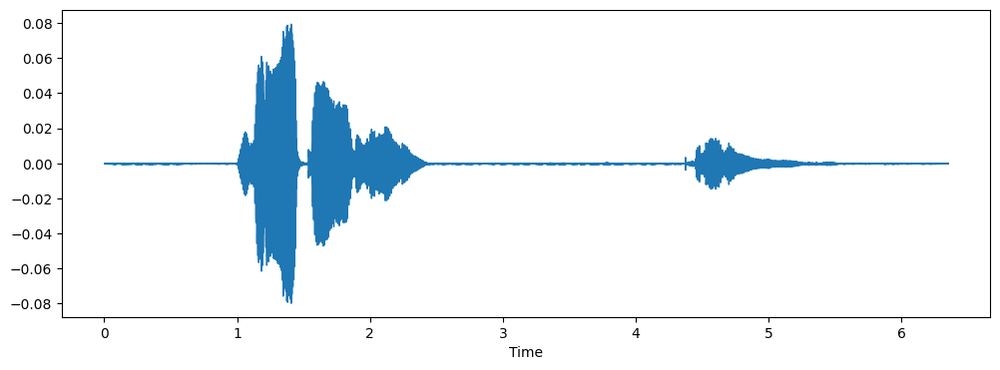

Sampling rate: 48000 Hz


In [ ]:
import matplotlib.pyplot as plt

audio_data, sampling_rate = librosa.load('/content'+df.iloc[36631]['wav_file'], sr=None)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(audio_data, sr=sampling_rate)
plt.show()

from IPython.display import Audio
# Print the sampling rate
print("Sampling rate:", sampling_rate, "Hz")
Audio(audio_data, rate=sampling_rate)

# Analyst

Installation

In [53]:
colab_requirements = [
    "pip install librosa",
    "pip install noisereduce==2.0.1",
    "pip install soundfile",
    "pip install pydub",
]

import sys, subprocess

def run_subprocess_command(cmd):
    # run the command
    process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE)
    # print the output
    for line in process.stdout:
        print(line.decode().strip())

IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    for i in colab_requirements:
        run_subprocess_command(i)

import

In [56]:
import pandas as pd
import numpy as np
import seaborn as sns
import csv
import IPython.display as ipd
import librosa
import soundfile as sf
from pydub import AudioSegment
from tqdm import tqdm
from denoise import denoise
from concurrent.futures import ProcessPoolExecutor
from IPython.display import Audio

our-library

In [57]:
def get_samplerate(path):
    return librosa.get_samplerate(path)

def get_duration(path):
    return librosa.get_duration(filename=path)

def clean_noise(data):
    voice_file, start, end = data
    destination_path = os.path.join(save_path, os.path.basename(voice_file))
    wav, sr = denoise(voice_file, start=start, end=end)
    os.makedirs(os.path.dirname(destination_path), exist_ok=True)
    sf.write(destination_path, wav, sr)
    print(f"File saved to: {destination_path}")
    return destination_path

def add_silent_intervals(data, save_path):
    voice_file, _ = data
    audio = AudioSegment.from_file(voice_file)
    silent_segment = AudioSegment.silent(duration=1000)  # 1 second = 1000 milliseconds
    final_audio = audio + silent_segment
    output_file = os.path.join(save_path, os.path.basename(voice_file))

    # Create the directory if it doesn't exist
    os.makedirs(os.path.dirname(output_file), exist_ok=True)

    final_audio.export(output_file, format="wav")
    print(f"Silent intervals added to: {output_file}")
    return output_file

def run_mp(func, data):
    with ProcessPoolExecutor(max_workers=4) as executor:
        results = list(tqdm(executor.map(func, data), total=len(data)))
        return results

def run_mp_silent(func, data, save_path):
    with ProcessPoolExecutor(max_workers=None) as executor:
        results = list(tqdm(executor.map(func, data, [save_path]*len(data)), total=len(data)))
        return results

In [ ]:
df = pd.read_csv('/content/map_df_att.csv', index_col=0)
df.head()

,wav_file,txt_file,txt_content,voice_actor_id,social_attitude,sentence_id,version_id,duration
0,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v01.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v01.txt,oui,F01,a1,s001,v01,2.101406
1,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v02.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v02.txt,oui,F01,a1,s001,v02,1.520907
2,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v03.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v03.txt,oui,F01,a1,s001,v03,1.782132
3,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v04.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v04.txt,oui,F01,a1,s001,v04,1.802449
4,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s001_v05.wav,/Volumes/CLEM_HDD/IRCAM/Open_SLR/txt/F01_a1_s001_v05.txt,oui,F01,a1,s001,v05,1.880816


In [58]:
df_ana = pd.DataFrame()
df_ana['raw_path'] = df['wav_file']
df_ana['voice_file'] = df['wav_file']
df_ana['text'] = df['txt_content']
df_ana

,raw_path,voice_file,text
0,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,oui
1,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,oui
2,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,oui
3,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,oui
4,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/F01_a1_s0...,oui
...,...,...,...
36629,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s0...,vous avez fait ce qu'il fallait
36630,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s0...,nous allons attendre qu'il arrive
36631,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s0...,nous allons attendre qu'il arrive
36632,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s0...,/Volumes/CLEM_HDD/IRCAM/Open_SLR/wav/M19_a4_s0...,nous allons prendre notre journée


In [ ]:
for i,val in df_ana.sample(10).iterrows():
    print(f"{i},{val['text']}")
    ipd.display(Audio('/content'+val['raw_path'], rate=44100))

18682,sans aucun doute


7485,bonne journée


18893,c’est vrai attendons un peu


20325,bonjour marie


18192,je pars demain


6746,il est tôt à new-york


29636,vous avez oublié mon verre


2791,non


4570,vous êtes partis rapidement


9064,bonne journée marie


In [59]:
# using AudioSegment.from_file instea of AudioSegment.from_wav due to unexpected error
df_ana['dBFS'] = df_ana.apply(lambda x : AudioSegment.from_file('/content'+x.voice_file).dBFS, axis = 1)
df_ana["sample_rate"] = df_ana.voice_file.apply(lambda x : get_samplerate('/content'+x))
df_ana["duration"] = df_ana.apply(lambda x : get_duration('/content'+x.voice_file), axis = 1)
df_ana["len"] = df_ana.text.apply(lambda x : len(x))

<ipython-input-57-11b2cdad4815>:5: FutureWarning: get_duration() keyword argument 'filename' has been renamed to 'path' in version 0.10.0.
	This alias will be removed in version 1.0.
  return librosa.get_duration(filename=path)


In [61]:
df_ana.describe()

,dBFS,sample_rate,duration,len
count,36634.000000,36634.000000,36634.000000,36634.000000
mean,-36.795439,44466.536551,2.664834,19.485669
std,9.979809,1138.059251,0.975817,7.853699
min,-78.745887,44100.000000,0.113197,3.000000
25%,-44.331932,44100.000000,1.985306,13.000000
50%,-34.158298,44100.000000,2.510000,20.000000
75%,-28.747116,44100.000000,3.184025,27.000000
max,-14.044053,48000.000000,16.830000,34.000000


<Axes: xlabel='len', ylabel='Count'>

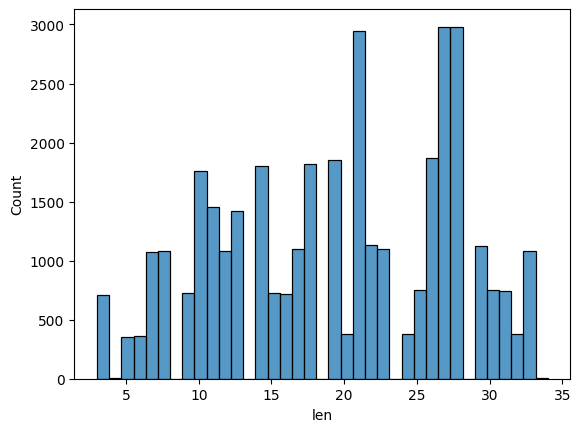

In [102]:
sns.histplot(df_ana['len'])

In [71]:
for i, row in df_ana.sort_values("dBFS", ascending = True).iloc[:5].iterrows():
  print(row["text"])
  print(row["dBFS"])
  display(Audio('/content' + row["voice_file"]))

ta soeur a bu toute la nuit
-78.74588697982924


il fait beau ce soir à paris
-78.65201203583


il est tôt à new-york
-76.43193385226714


je suis parti tôt
-75.18934407206537


donne moi une réponse
-74.53810199706786


In [ ]:
#df_ana = df_ana.drop(df_ana[df_ana['dBFS'] < -40].index)
#sns.histplot(df['dBFS'])

In [104]:
for i, row in df_ana.drop_duplicates(subset=['text']).reset_index(drop=True).sort_values("len", ascending = True).iloc[:5].iterrows():
  print(row["text"])
  print(row["duration"], row['len'])
  display(Audio('/content' + row["voice_file"]))

oui
2.10140589569161 3


non
1.6370068027210884 3


non 
3.311746031746032 4


oui 
2.249433106575964 4


salut
2.1304308390022677 5


In [112]:
for i, row in df_ana.drop_duplicates(subset=['text']).reset_index(drop=True).iterrows():
  print(i,"a+a" + row['text'] + "a+a")

0 a+aouia+a
1 a+anona+a
2 a+acertesa+a
3 a+abien-sûra+a
4 a+asaluta+a
5 a+abonjoura+a
6 a+abonsoira+a
7 a+atant pisa+a
8 a+atrès biena+a
9 a+ac’est vraia+a
10 a+apar icia+a
11 a+aau revoira+a
12 a+aà demaina+a
13 a+aimpossiblea+a
14 a+avolontiersa+a
15 a+aj'ai tousséa+a
16 a+apeu importea+a
17 a+anous partonsa+a
18 a+abonne journéea+a
19 a+abonsoir jeannea+a
20 a+afaites leur signea+a
21 a+aasseyez vousa+a
22 a+aévidemmenta+a
23 a+aassurémenta+a
24 a+ail est midia+a
25 a+asalut mariea+a
26 a+atu as marchéa+a
27 a+aau revoir yanna+a
28 a+abonjour mariea+a
29 a+ata soeur a bua+a
30 a+aà demain paula+a
31 a+ail faisait bona+a
32 a+aje pars demaina+a
33 a+apar ici jeannea+a
34 a+aje pars ce soira+a
35 a+aelle a pris peura+a
36 a+asans aucun doutea+a
37 a+aje prends le tempsa+a
38 a+aveuillez me croirea+a
39 a+adonc fais moi signea+a
40 a+aje prends une pausea+a
41 a+afaites lui confiancea+a
42 a+adonne leur une chancea+a
43 a+avous avez dormia+a
44 a+aje suis parti tôta+a
45 a+anous avons 

In [ ]:
df_ana = df_ana.drop_duplication(subset=['text']).reset_index(drop=True)

In [ ]:
for i,row in df_ana.sort_values("duration",ascending =False),iloc[:10].iterows():
  print(row["text"])
  print(row["duration"], row['len'])
  ipd.displlay(ipd.Audio(row['voice_file']))

In [98]:
for i, row in df_ana.sort_values("dBFS", ascending = False).iloc[:5].iterrows():
  print(row["text"])
  print(row["duration"], row['len'])
  display(Audio('/content' + row["voice_file"]))

non
1.9824036281179138 3


ta soeur a bu toute la nuit
1.4831746031746031 27


non
0.9026757369614512 3


bonne journée marie
2.0172335600907028 19


nous allons prendre des vacances
2.7109297052154195 32


In [86]:
# Filter the DataFrame to get rows where 'dBFS' > -40
df_dBFS_40 = df_ana[df_ana['dBFS'] > -40]

for i, row in df_dBFS_40.sort_values("dBFS", ascending=True).iloc[:20].iterrows():
    print(f"Text: {row['text']}")
    print(f"dBFS: {row['dBFS']}")
    display(Audio('/content' + row["voice_file"], rate=44100))


Text: vous avez pris le temps
dBFS: -39.995163291780415


Text: volontiers
dBFS: -39.99152182496077


Text: nous allons attendre un peu
dBFS: -39.99152182496077


Text: certes
dBFS: -39.99152182496077


Text: je pars tout de suite
dBFS: -39.99152182496077


Text: vous êtes allés à la plage
dBFS: -39.99152182496077


Text: il faisait froid aujourd'hui
dBFS: -39.99152182496077


Text: nous allons attendre un peu
dBFS: -39.99152182496077


Text: oui
dBFS: -39.99152182496077


Text: vous êtes partis rapidement
dBFS: -39.99152182496077


Text: faisons leur confiance
dBFS: -39.99152182496077


Text: elle est partie pour bale
dBFS: -39.98913771356773


Text: vous avez dormi
dBFS: -39.98828297043217


Text: par ici jeanne
dBFS: -39.98821268811344


Text: c’est vrai allons prendre un café
dBFS: -39.97776149625921


Text: il faisait froid aujourd'hui
dBFS: -39.973587360733944


Text: donne moi une occasion
dBFS: -39.971227919638174


Text: donne moi une réponse
dBFS: -39.96920806673535


Text: tu as fait ce que je voulais
dBFS: -39.96787492287606


Text: c’est vrai attendons un peu
dBFS: -39.96508074019487


In [92]:
df_dBFS = df_ana[df_ana['dBFS'] > -15]

for i, row in df_dBFS.sort_values("dBFS", ascending=True).iloc[:5].iterrows():
    print(f"Text: {row['text']}")
    print(f"dBFS: {row['dBFS']}")
    display(Audio('/content' + row["voice_file"], rate=44100))


Text: non
dBFS: -14.044052681242256


In [100]:
check_duration_least = df_ana[df_ana['dBFS'] < -40]
check_duration_least.describe()

,dBFS,sample_rate,duration,len
count,12999.000000,12999.000000,12999.000000,12999.000000
mean,-48.380286,45118.878375,2.297751,19.285560
std,5.922453,1713.399651,0.904542,7.930107
min,-78.745887,44100.000000,0.113197,3.000000
25%,-51.987575,44100.000000,1.680000,13.000000
50%,-47.169693,44100.000000,2.120000,19.000000
75%,-43.771100,48000.000000,2.720000,27.000000
max,-40.001109,48000.000000,16.830000,33.000000


In [101]:
check_duration_least['duration'].sum()/60/60

8.296797173209562

In [ ]:
# Calculate dBFS, sample rate, and duration
df_ana['dBFS'] = df_ana.apply(lambda x: AudioSegment.from_file('/content' + x.voice_file).dBFS, axis=1)
df_ana['sample_rate'] = df_ana.voice_file.apply(lambda x: get_samplerate('/content' + x))
df_ana['duration'] = df_ana.apply(lambda x: get_duration('/content' + x.voice_file), axis=1)
df_ana['len'] = df_ana.text.apply(lambda x: len(x))

# Filter the DataFrame to get rows where 'dBFS' < -40
df_dBFS_less_than_40 = df_ana[df_ana['dBFS'] < -40]

# Calculate the sum of the duration for these rows
total_duration_less_than_40 = df_dBFS_less_than_40['duration'].sum()

print(f"Total duration of audio files with dBFS < -40: {total_duration_less_than_40} seconds")